# Exploratory Data Analysis

In [27]:
import pandas as pd
import os
import plotly.graph_objs as go
import random

### 1. Data Preprocessing

In [123]:
# load data
input_path = 'artworks'
df = pd.read_csv(os.path.join(input_path, 'artists.csv'))

In [124]:
df.head()

,id,name,years,genre,nationality,bio,wikipedia,paintings
0,0,Amedeo Modigliani,1884 - 1920,Expressionism,Italian,Amedeo Clemente Modigliani (Italian pronunciat...,http://en.wikipedia.org/wiki/Amedeo_Modigliani,193
1,1,Vasiliy Kandinskiy,1866 - 1944,"Expressionism,Abstractionism",Russian,Wassily Wassilyevich Kandinsky (Russian: Васи́...,http://en.wikipedia.org/wiki/Wassily_Kandinsky,88
2,2,Diego Rivera,1886 - 1957,"Social Realism,Muralism",Mexican,Diego María de la Concepción Juan Nepomuceno E...,http://en.wikipedia.org/wiki/Diego_Rivera,70
3,3,Claude Monet,1840 - 1926,Impressionism,French,Oscar-Claude Monet (; French: [klod mɔnɛ]; 14 ...,http://en.wikipedia.org/wiki/Claude_Monet,73
4,4,Rene Magritte,1898 - 1967,"Surrealism,Impressionism",Belgian,René François Ghislain Magritte (French: [ʁəne...,http://en.wikipedia.org/wiki/René_Magritte,194


In [125]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50 entries, 0 to 49
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   id           50 non-null     int64 
 1   name         50 non-null     object
 2   years        50 non-null     object
 3   genre        50 non-null     object
 4   nationality  50 non-null     object
 5   bio          50 non-null     object
 6   wikipedia    50 non-null     object
 7   paintings    50 non-null     int64 
dtypes: int64(2), object(6)
memory usage: 3.2+ KB


**From above printing, we can know there is no missing value in the dataset.**

In [126]:
# append paths of images to the dataframe
image_path = os.path.join(input_path, 'images/images')
artist_list = sorted(os.listdir(image_path))
artist_list.remove('Albrecht_DuÔòá├¬rer') # remove one of the same names
df_images = pd.DataFrame(columns=['name', 'image_path'], dtype=object)

n_images = 0
for artist in artist_list:
    artist_images = os.listdir(os.path.join(image_path, artist))
    n_images += len(artist_images)
    df_images = pd.concat([df_images, pd.DataFrame({'name': ' '.join(artist.split('_')), 'image_path': [sorted(artist_images)]})], axis=0)

df_images.index = range(50)
df_images.loc[df_images.name == 'Albrecht Du╠êrer', 'name'] = 'Albrecht Dürer'
df = df.merge(df_images, left_on='name', right_on='name')

In [127]:
df.head()

,id,name,years,genre,nationality,bio,wikipedia,paintings,image_path
0,0,Amedeo Modigliani,1884 - 1920,Expressionism,Italian,Amedeo Clemente Modigliani (Italian pronunciat...,http://en.wikipedia.org/wiki/Amedeo_Modigliani,193,"[Amedeo_Modigliani_1.jpg, Amedeo_Modigliani_10..."
1,1,Vasiliy Kandinskiy,1866 - 1944,"Expressionism,Abstractionism",Russian,Wassily Wassilyevich Kandinsky (Russian: Васи́...,http://en.wikipedia.org/wiki/Wassily_Kandinsky,88,"[Vasiliy_Kandinskiy_1.jpg, Vasiliy_Kandinskiy_..."
2,2,Diego Rivera,1886 - 1957,"Social Realism,Muralism",Mexican,Diego María de la Concepción Juan Nepomuceno E...,http://en.wikipedia.org/wiki/Diego_Rivera,70,"[Diego_Rivera_1.jpg, Diego_Rivera_10.jpg, Dieg..."
3,3,Claude Monet,1840 - 1926,Impressionism,French,Oscar-Claude Monet (; French: [klod mɔnɛ]; 14 ...,http://en.wikipedia.org/wiki/Claude_Monet,73,"[Claude_Monet_1.jpg, Claude_Monet_10.jpg, Clau..."
4,4,Rene Magritte,1898 - 1967,"Surrealism,Impressionism",Belgian,René François Ghislain Magritte (French: [ʁəne...,http://en.wikipedia.org/wiki/René_Magritte,194,"[Rene_Magritte_1.jpg, Rene_Magritte_10.jpg, Re..."


In [128]:
n_artists = len(df)

print('There are totally {} artists in the dataset'.format(n_artists))
print('There are totally {} paintings in the dataset'.format(n_images))

There are totally 50 artists in the dataset
There are totally 8446 paintings in the dataset


### 2. Data Analysis

In [129]:
# a function to randomly choose colors
def random_colors(number):
    return ['#'+''.join([random.choice('0123456789ABCDEF') for m in range(6)]) for n in range(number)]

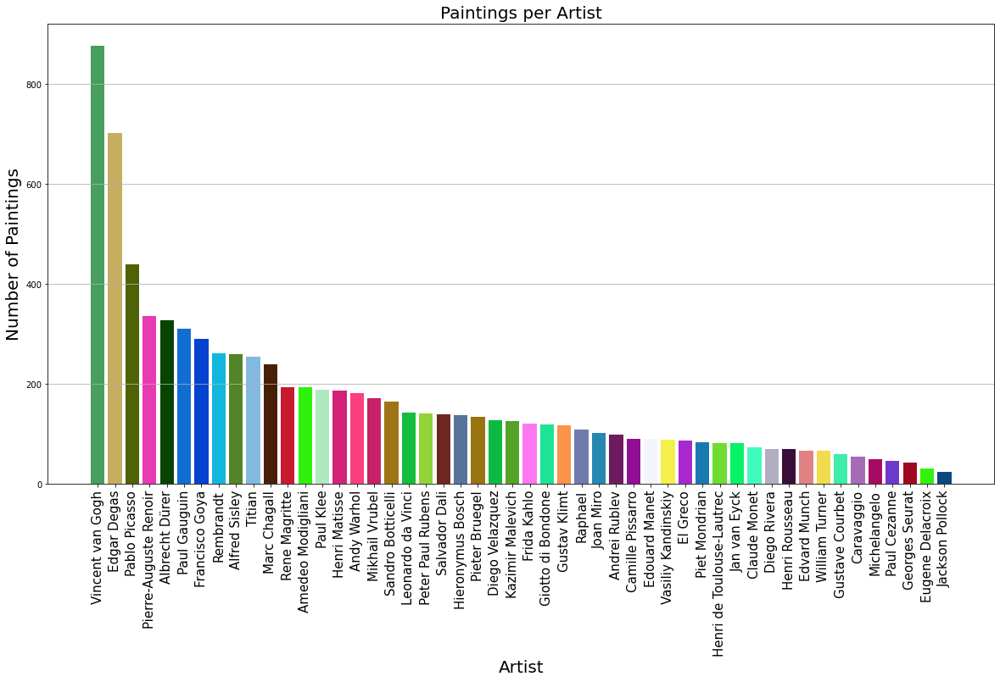

In [177]:
import matplotlib.pyplot as plt
import numpy as np

painting_sort = df.sort_values(by='paintings', ascending = False)
plt.figure(figsize=(20,10))
plt.bar(painting_sort['name'], painting_sort['paintings'], color=random_colors(50))
plt.xlabel('Artist', fontsize=20)
plt.xticks(rotation=90, fontsize=15)
plt.ylabel('Number of Paintings', fontsize=20)
plt.title('Paintings per Artist', fontsize=20)
plt.grid(axis='y')

# import plotly.express as px
# fig = px.bar(painting_sort, x="name", y="paintings", color="name", title="Long-Form Input")
# fig.show()

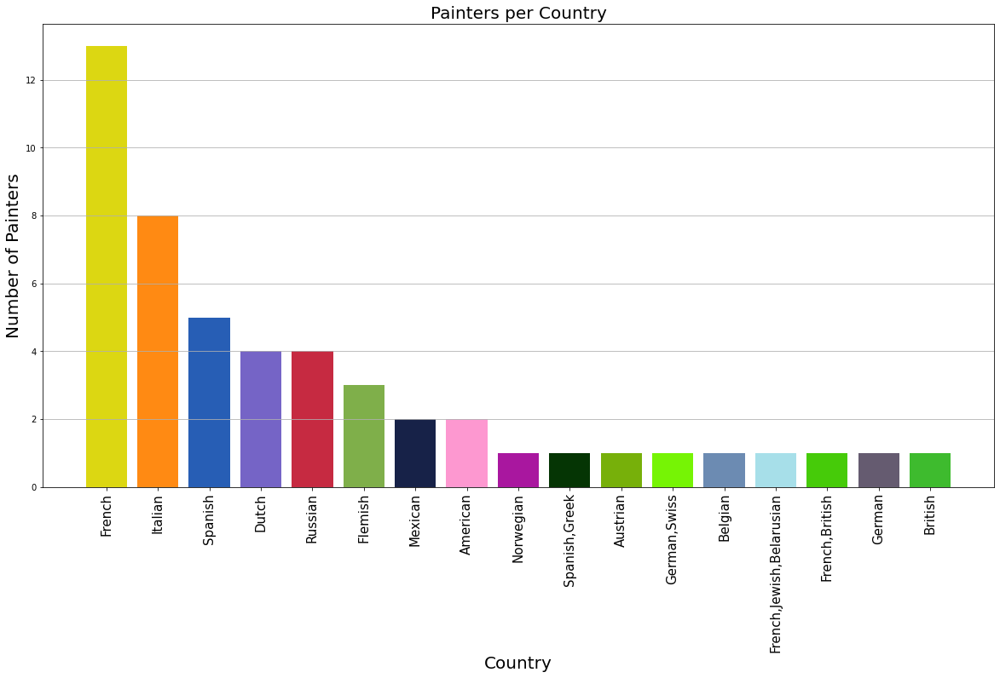

In [186]:
nationality = painting_sort.nationality.value_counts()

plt.figure(figsize=(20,10))
plt.bar(nationality.index, nationality.values, color=random_colors(50))
plt.xlabel('Country', fontsize=20)
plt.xticks(rotation=90, fontsize=15)
plt.ylabel('Number of Painters', fontsize=20)
plt.title('Painters per Country', fontsize=20)
plt.grid(axis='y')

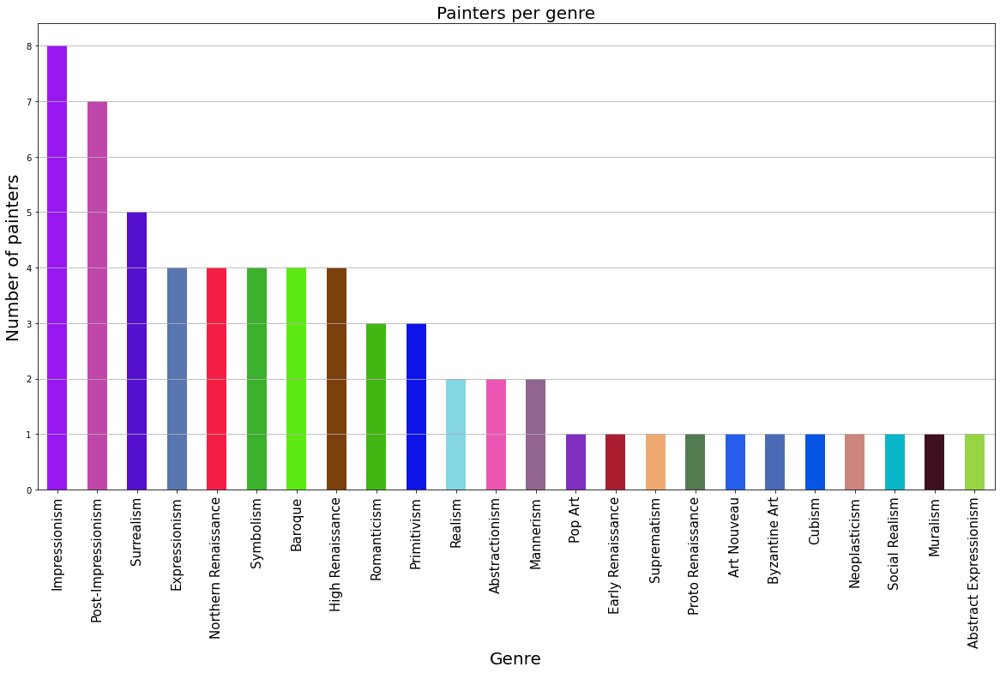

In [272]:
plt.figure(figsize=(20,10))
painting_sort['genre'].apply(lambda x: list(x.split(','))).explode().value_counts().plot.bar(color=random_colors(50))

plt.xlabel('Genre', fontsize=20)
plt.xticks(rotation=90, fontsize=15)
plt.ylabel('Number of painters', fontsize=20)
plt.title('Painters per genre', fontsize=20)
plt.grid(axis='y')

There are totally 24 genre.


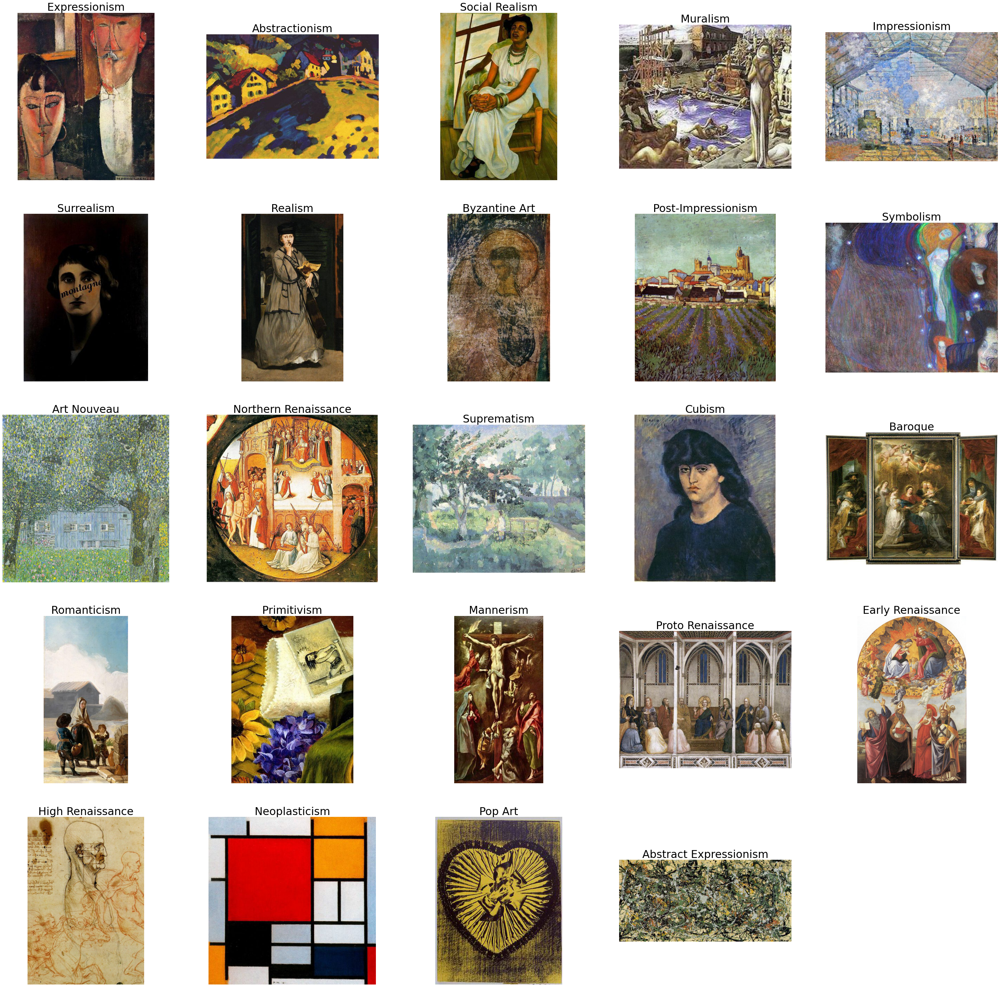

In [320]:
df_new = df.copy()
df_new['genre'] = df_new['genre'].apply(lambda x: list(x.split(',')))
df_new = df_new.explode('genre')

print('There are totally {} genre.'.format(len(df_new['genre'].unique())))
plt.figure(figsize=(50,50))
for i, kind in enumerate(df_new['genre'].unique()):
    images = df_new[df_new['genre'] == kind].iloc[0]['image_path']
    index = random.randint(0, len(images)-1)
    image_path = os.path.join('artworks/resized/resized', str(images[index]))
    image = plt.imread(image_path)
    
    plt.subplot(5,5, i+1)
    plt.axis('off')
    plt.title('{}'.format(kind), fontsize=30)
    plt.imshow(image)

plt.show()